In [27]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


Si on lui donne une autre distribution autre que un dinosore pour un modèle entrainé sur un dinausore 

In [1]:
import math

import matplotlib.pyplot as plt
import numpy as np
import torch
from tqdm.auto import tqdm

import ddpm
import datasets

/users/eleves-a/2021/ines.yaici/.local/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
2024-03-05 16:18:08.020358: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-05 16:18:08.020400: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-05 16:18:08.235365: 

In [8]:
dino = datasets.dino_dataset()
print(len(dino))
print(len(dino[0]))
print(len(dino[0][0]))


8000
1
2


In [19]:
from torch.utils.data import DataLoader
dataloader = DataLoader( datasets.dino_dataset(8000) , batch_size=32, shuffle=True, drop_last=True)

print(len(dataloader))
print(type(dataloader))
print(dataloader.batch_size)

for step, batch in enumerate(dataloader):
    print(step, batch[0].shape)


250
<class 'torch.utils.data.dataloader.DataLoader'>
32
0 torch.Size([32, 2])
1 torch.Size([32, 2])
2 torch.Size([32, 2])
3 torch.Size([32, 2])
4 torch.Size([32, 2])
5 torch.Size([32, 2])
6 torch.Size([32, 2])
7 torch.Size([32, 2])
8 torch.Size([32, 2])
9 torch.Size([32, 2])
10 torch.Size([32, 2])
11 torch.Size([32, 2])
12 torch.Size([32, 2])
13 torch.Size([32, 2])
14 torch.Size([32, 2])
15 torch.Size([32, 2])
16 torch.Size([32, 2])
17 torch.Size([32, 2])
18 torch.Size([32, 2])
19 torch.Size([32, 2])
20 torch.Size([32, 2])
21 torch.Size([32, 2])
22 torch.Size([32, 2])
23 torch.Size([32, 2])
24 torch.Size([32, 2])
25 torch.Size([32, 2])
26 torch.Size([32, 2])
27 torch.Size([32, 2])
28 torch.Size([32, 2])
29 torch.Size([32, 2])
30 torch.Size([32, 2])
31 torch.Size([32, 2])
32 torch.Size([32, 2])
33 torch.Size([32, 2])
34 torch.Size([32, 2])
35 torch.Size([32, 2])
36 torch.Size([32, 2])
37 torch.Size([32, 2])
38 torch.Size([32, 2])
39 torch.Size([32, 2])
40 torch.Size([32, 2])
41 torch.Si






















# Mnist dataset 


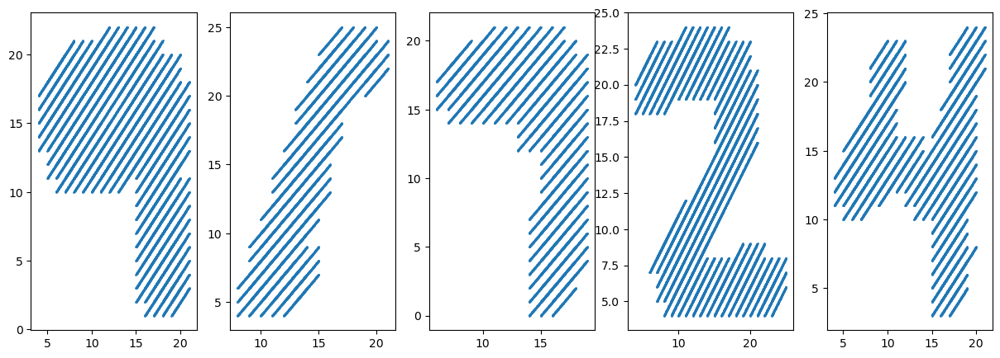

In [32]:
# plot some images from the mnist_dataset()

mnist = datasets.mnist_dataset()

def extract_data(dataset):
    return [d[0].numpy() for d in dataset]

mnist_data = extract_data(mnist)

fig, axs = plt.subplots(1, 5, figsize=(15, 5))

axs[0].scatter(*zip(*mnist_data), s=1)

# I want to plot more than 1 plot 

for i in range(1, 5):
    mnist = datasets.mnist_dataset()
    mnist_data = extract_data(mnist)
    axs[i].scatter(*zip(*mnist_data), s=1)

    


In [25]:
!python ddpm.py --dataset mnist --experiment_name mnist_base

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
2024-03-01 15:28:50.089867: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-01 15:28:50.089900: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-01 15:28:50.090720: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-01 15:28:50.095596: I tensorflow/core/platform/cpu_feature_guard.cc:182] This 

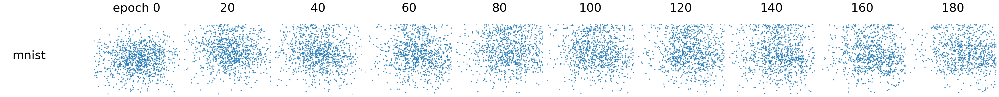

In [26]:
frames_dict = {
    "mnist": np.load("exps/mnist_base/frames.npy")
}

plot_ablation(frames_dict, "static/ablation_mnist.png")

### forward

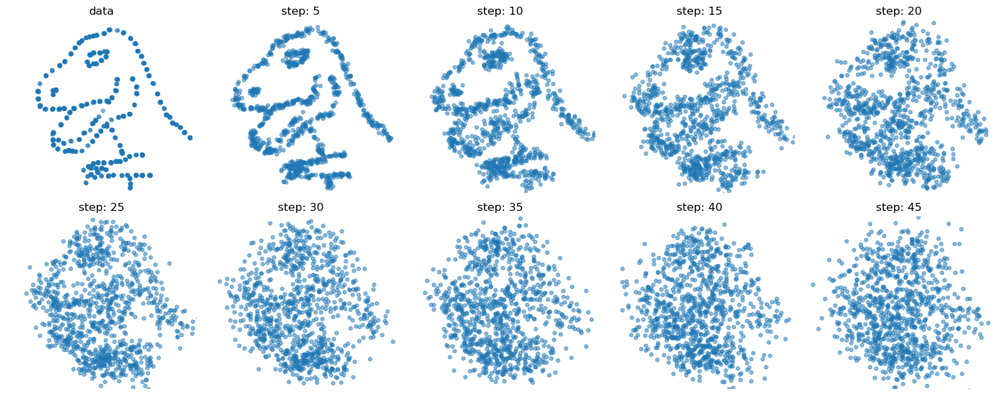

In [16]:
num_timesteps = 50
plot_step = 5

num_plots = math.ceil(num_timesteps / plot_step)
num_cols = 5
num_rows = math.ceil(num_plots / num_cols)

fig = plt.figure(figsize=(15, 6))

noise_scheduler = ddpm.NoiseScheduler(num_timesteps=num_timesteps)
dataset = datasets.get_dataset("dino", n=1000)
x0 = dataset.tensors[0]

plt_cnt = 1
plt.subplot(num_rows, num_cols, plt_cnt)
plt.scatter(x0[:, 0], x0[:, 1], alpha=0.5, s=15)
plt.title("data")
plt.xlim(-3.5, 3.5)
plt.ylim(-4., 4.75)
plt.axis("off")
        
for t in range(len(noise_scheduler)):
    timesteps = np.repeat(t, len(x0))
    noise = torch.randn_like(x0)
    sample = noise_scheduler.add_noise(x0, noise, timesteps)
    if (t + 1) % plot_step == 0 and (t + 1) != len(noise_scheduler):
        plt_cnt += 1
        plt.subplot(num_rows, num_cols, plt_cnt)
        plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15)
        plt.title(f"step: {t + 1}")
        plt.xlim(-3.5, 3.5)
        plt.ylim(-4., 4.75)
        plt.axis("off")
        
fig.tight_layout()
plt.savefig("static/forward.png", facecolor="white")
plt.show()

### reverse

In [17]:
!python ddpm.py --experiment_name dino_base

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
Epoch 1:  76%|██████▉  | 191/250 [00:00<00:00, 433.15it/s, loss=0.712, step=440]^C
Traceback (most recent call last):
  File "/users/eleves-a/2021/ines.yaici/Desktop/INF442/3A/INF583/Project-tiny-diffusion/ddpm.py", line 266, in <module>
    nn.utils.clip_grad_norm_(model.parameters(), 1.0)
  File "/users/eleves-a/2021/ines.yaici/.local/lib/python3.9/site-packages/torch/nn/utils/clip_grad.py", line 46, in clip_grad_norm_
    = _group_tensors_by_device_and_dtype([[g.detach() for g in grads]])  # type: ignore[assignment]
  File "/users/eleves-a/2021/ines.yaici/.local/lib/python3.9/site-packages/torch/utils/_contextlib.py", line 115, in decorate_context
    return func(*args, **kwargs)
  File "/us

In [ ]:
model = ddpm.MLP()

path = "exps/dino_base/model.pth"
model.load_state_dict(torch.load(path))
model.eval()

MLP(
  (time_mlp): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (input_mlp1): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (input_mlp2): PositionalEmbedding(
    (layer): SinusoidalEmbedding()
  )
  (joint_mlp): Sequential(
    (0): Linear(in_features=384, out_features=128, bias=True)
    (1): GELU(approximate='none')
    (2): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (3): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (4): Block(
      (ff): Linear(in_features=128, out_features=128, bias=True)
      (act): GELU(approximate='none')
    )
    (5): Linear(in_features=128, out_features=2, bias=True)
  )
)

In [ ]:
eval_batch_size = 1000
num_timesteps = 50
plot_step = 5
noise_scheduler = ddpm.NoiseScheduler(num_timesteps=num_timesteps)
sample = torch.randn(eval_batch_size, 2)
timesteps = list(range(num_timesteps))[::-1]
samples = []
steps = []
for i, t in enumerate(tqdm(timesteps)):
    t = torch.from_numpy(np.repeat(t, eval_batch_size)).long()
    with torch.no_grad():
        residual = model(sample, t)
    sample = noise_scheduler.step(residual, t[0], sample)
    if (i + 1) % plot_step == 0:
        samples.append(sample.numpy())
        steps.append(i + 1)

100%|██████████| 50/50 [00:00<00:00, 329.22it/s]


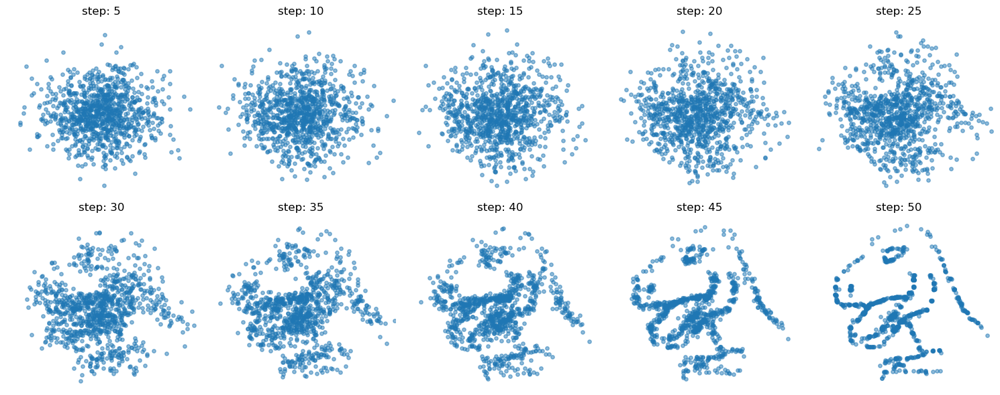

In [ ]:
num_cols = 5
num_rows = math.ceil(len(samples) / num_cols)
fig = plt.figure(figsize=(15, 6))
for i, sample in enumerate(samples):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.scatter(sample[:, 0], sample[:, 1], alpha=0.5, s=15)
    plt.title(f"step: {steps[i]}")
    plt.xlim(-3.5, 3.5)
    plt.ylim(-4., 4.75)
    plt.axis("off")
fig.tight_layout()
plt.savefig("static/reverse.png", facecolor="white")
plt.show()

## Visualisation des nouveau datasets : 

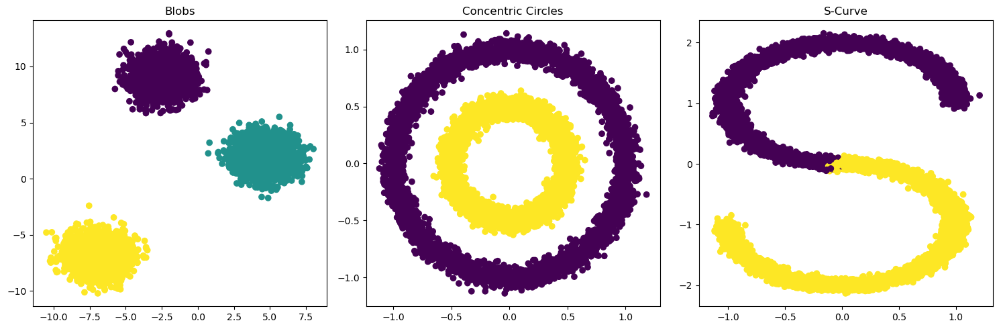

In [3]:
blob_data = datasets.blobs_dataset()
circle_data = datasets.concentric_circles_dataset()
s_curve_data = datasets.s_curve_dataset()

# Visualisation
fig, axs = plt.subplots(1, 3, figsize=(15, 5))
for ax, data, title in zip(axs, [blob_data, circle_data, s_curve_data], ['Blobs', 'Concentric Circles', 'S-Curve']):
    X, y = data.tensors
    ax.scatter(X[:, 0], X[:, 1], c=y, cmap='viridis')
    ax.set_title(title)
plt.tight_layout()
plt.show()

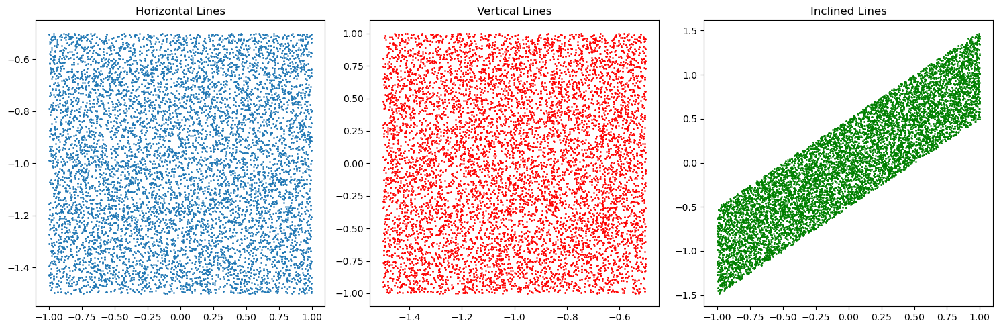

In [4]:
horizontal_lines = datasets.horizontal_lines_dataset()
vertical_lines = datasets.vertical_lines_dataset()
inclined_lines = datasets.inclined_lines_dataset()

def extract_data(dataset):
    return [d[0].numpy() for d in dataset]

horizontal_data = extract_data(horizontal_lines)
vertical_data = extract_data(vertical_lines)
inclined_data = extract_data(inclined_lines)


fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Horizontal line
axs[0].scatter(*zip(*horizontal_data), s=1)
axs[0].set_title("Horizontal Lines")

# Vertical line
axs[1].scatter(*zip(*vertical_data), s=1, color='red')
axs[1].set_title("Vertical Lines")

# Inclined line
axs[2].scatter(*zip(*inclined_data), s=1, color='green')
axs[2].set_title("Inclined Lines")

plt.tight_layout()
plt.show()

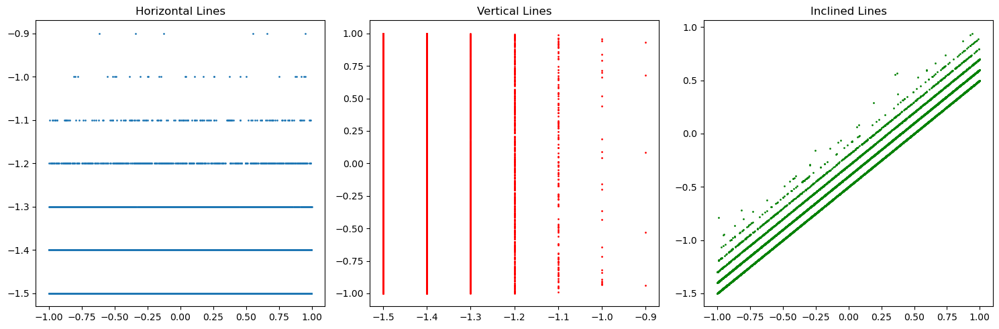

In [8]:
horizontal_lines = datasets.horizontal_lines_dataset_poisson()
vertical_lines = datasets.vertical_lines_dataset_poisson()
inclined_lines = datasets.inclined_lines_dataset_poisson()

def extract_data(dataset):
    return [d[0].numpy() for d in dataset]

horizontal_data = extract_data(horizontal_lines)
vertical_data = extract_data(vertical_lines)
inclined_data = extract_data(inclined_lines)


fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Horizontal line
axs[0].scatter(*zip(*horizontal_data), s=1)
axs[0].set_title("Horizontal Lines")

# Vertical line
axs[1].scatter(*zip(*vertical_data), s=1, color='red')
axs[1].set_title("Vertical Lines")

# Inclined line
axs[2].scatter(*zip(*inclined_data), s=1, color='green')
axs[2].set_title("Inclined Lines")

plt.tight_layout()
plt.show()

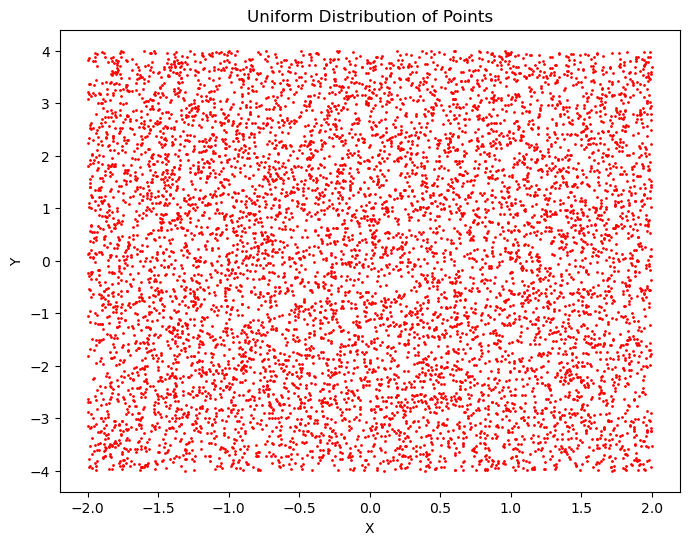

In [ ]:
line_data = datasets.line_dataset()

# Extract data for plotting
line_data_points = extract_data(line_data)

# Plotting
plt.figure(figsize=(8, 6))
plt.scatter(*zip(*line_data_points), s=1, color='red')
plt.title("Uniform Distribution of Points")
plt.xlabel("X")
plt.ylabel("Y")
plt.show()

## ablations

In [29]:
def plot_ablation(frames_dict, outname):
    num_rows = len(frames_dict)
    num_cols = 10

    fig = plt.figure(figsize=(3.5*num_cols, 3*num_rows + 0.5))
    row = 0

    for name, frames in frames_dict.items():
        epoch_step = len(frames) // num_cols
        offset = row*(num_cols + 1)
        plt.subplot(num_rows, num_cols + 1, offset + 1)
        plt.scatter(0, 0, alpha=0)
        plt.text(0, 0, name, fontdict={"size": 30})
        plt.xlim(-0.25, 2)
        plt.axis("off")

        for i in range(num_cols):
            plt.subplot(num_rows, num_cols + 1, offset + i + 2)
            ix = i * epoch_step
            frame = frames[ix]
            plt.scatter(frame[:, 0], frame[:, 1], s=5, alpha=0.7)
            if row == 0:
                if i == 0:
                    title = f"epoch {ix}"
                else:
                    title = f"{ix}"
                plt.title(title, fontdict={"size": 30}, pad=30)
            plt.xlim(-3.5, 3.5)
            plt.ylim(-4., 4.75)
            plt.axis("off")

        row += 1

    plt.tight_layout()
    plt.savefig(outname, facecolor="white")
    plt.show()

### New datasets

In [1]:
# plot 10 frames from the random dataset

model = "exps/random_base/model.pth"

fig, axs = plt.subplots(1, 5, figsize=(15, 5))

for i in range(5):
    random = datasets.random_dataset()
    random_data = extract_data(random)
    print(len(random_data[0]))
    # using denoise function 
    denoized = ddpm.denoise_image(model, random)
    
 
    denoized_data = extract_data(denoized)
    
    axs[i].scatter(*zip(*random_data), s=1) 
    axs[i].scatter(*zip(*denoized_data), s=1)
    
plt.tight_layout()
plt.show()



NameError: name 'plt' is not defined

In [39]:
# use the radom dataset to plot the ablation
!python ddpm.py --dataset random --experiment_name random_base

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
2024-03-01 15:50:48.081192: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-01 15:50:48.081224: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-01 15:50:48.081976: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-03-01 15:50:48.086225: I tensorflow/core/platform/cpu_feature_guard.cc:182] This 

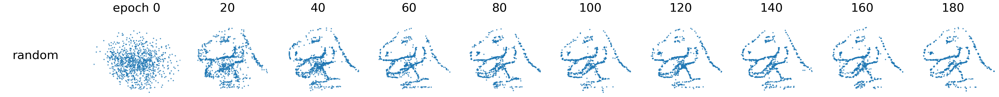

In [40]:
data_frames = {
    "random": np.load("exps/random_base/frames.npy")
}

plot_ablation(data_frames, "static/ablation_random.png")

In [2]:
!python ddpm.py --dataset horizontal_lines --experiment_name horizontal_base
!python ddpm.py --dataset vertical_lines --experiment_name vertical_base
!python ddpm.py --dataset inclined_lines --experiment_name inclined_base


/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 645.47it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 642.64it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

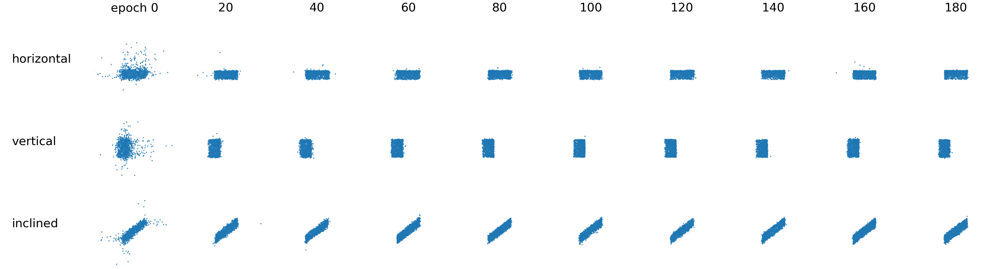

In [6]:
frames_dict = {
    "horizontal": np.load("exps/horizontal_base/frames.npy"),
    "vertical": np.load("exps/vertical_base/frames.npy"),
    "inclined": np.load("exps/inclined_base/frames.npy"),

}

plot_ablation(frames_dict, "static/datasets_lines_uniform.png")

In [9]:
!python ddpm.py --dataset horizontal_lines_poisson --experiment_name horizontal_poisson_base
!python ddpm.py --dataset vertical_lines_poisson --experiment_name vertical_poisson_base
!python ddpm.py --dataset inclined_lines_poisson --experiment_name inclined_poisson_base

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 553.10it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 657.87it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

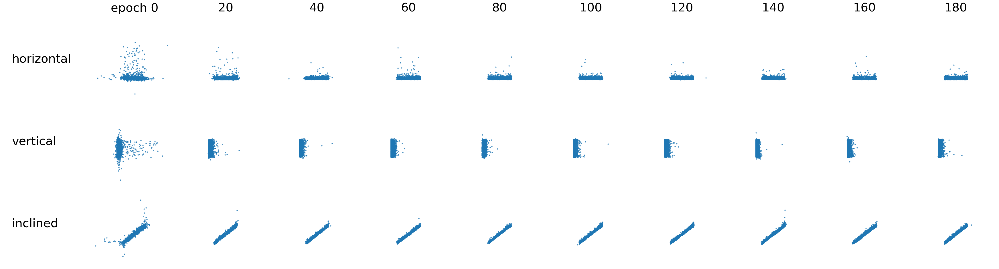

In [11]:
frames_dict = {
    "horizontal": np.load("exps/horizontal_poisson_base/frames.npy"),
    "vertical": np.load("exps/vertical_poisson_base/frames.npy"),
    "inclined": np.load("exps/inclined_poisson_base/frames.npy"),
}

plot_ablation(frames_dict, "static/datasets_lines_poisson.png")

In [1]:
!python ddpm.py --dataset blobs --experiment_name blobs_base
!python ddpm.py --dataset concentric_circles --experiment_name concentric_circles_base
!python ddpm.py --dataset s_curve --experiment_name s_curve_base


/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 811.09it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 719.81it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

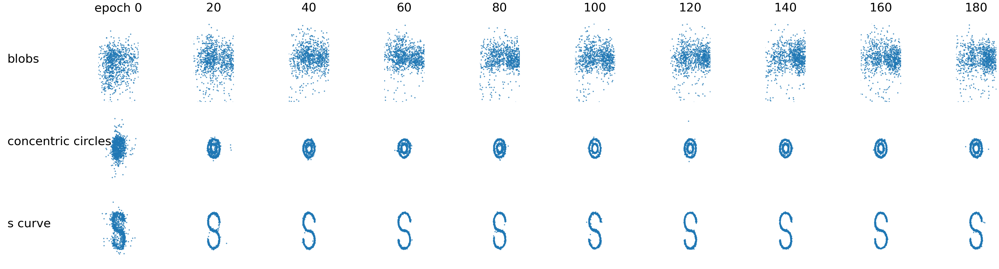

In [7]:
frames_dict = {
    "blobs": np.load("exps/blobs_base/frames.npy"),
    "concentric circles": np.load("exps/concentric_circles_base/frames.npy"),
    "s curve": np.load("exps/s_curve_base/frames.npy"),
}

plot_ablation(frames_dict, "static/datasets2.png")

Il arrive pas à dénoizer une distribution gaussiennes 

In [9]:
!python ddpm.py --dataset moons --experiment_name moons_base
!python ddpm.py --dataset dino --experiment_name dino_base
!python ddpm.py --dataset line --experiment_name line_base
!python ddpm.py --dataset circle --experiment_name circle_base

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 734.18it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 746.59it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

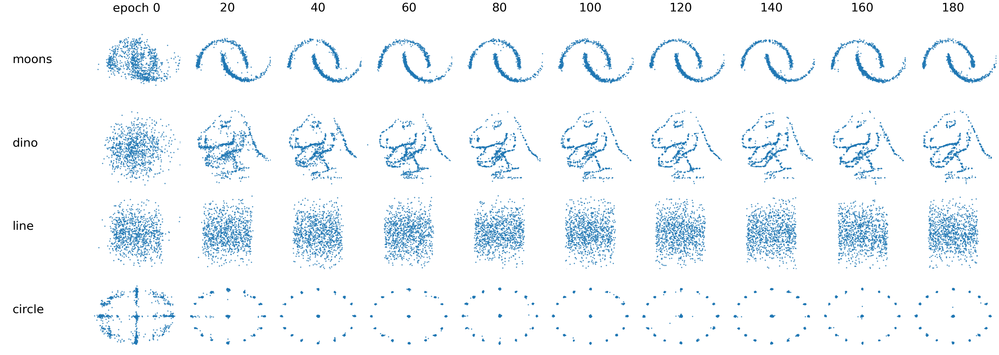

In [10]:
frames_dict = {
    "moons": np.load("exps/moons_base/frames.npy"),
    "dino": np.load("exps/dino_base/frames.npy"),
    "line": np.load("exps/line_base/frames.npy"),
    "circle": np.load("exps/circle_base/frames.npy"),
}

plot_ablation(frames_dict, "static/datasets.png")

### learning rate

In [11]:
!python ddpm.py --learning_rate 1e-2 --experiment_name dino_lr1e-2
!python ddpm.py --learning_rate 1e-3 --experiment_name dino_lr1e-3
!python ddpm.py --learning_rate 1e-4 --experiment_name dino_lr1e-4
!python ddpm.py --learning_rate 1e-5 --experiment_name dino_lr1e-5

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 767.34it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 728.03it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

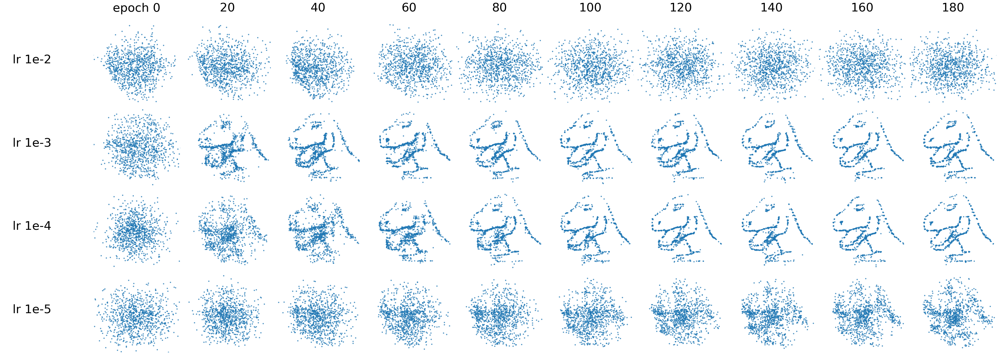

In [12]:
frames_dict = {
    "lr 1e-2": np.load("exps/dino_lr1e-2/frames.npy"),
    "lr 1e-3": np.load("exps/dino_lr1e-3/frames.npy"),
    "lr 1e-4": np.load("exps/dino_lr1e-4/frames.npy"),
    "lr 1e-5": np.load("exps/dino_lr1e-5/frames.npy"),
}

plot_ablation(frames_dict, "static/learning_rate.png")

### num_timesteps

In [13]:
!python ddpm.py --num_timesteps 5 --experiment_name dino_timesteps5
!python ddpm.py --num_timesteps 10 --experiment_name dino_timesteps10
!python ddpm.py --num_timesteps 25 --experiment_name dino_timesteps25
!python ddpm.py --num_timesteps 50 --experiment_name dino_timesteps50
!python ddpm.py --num_timesteps 100 --experiment_name dino_timesteps100
!python ddpm.py --num_timesteps 250 --experiment_name dino_timesteps250

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|████████████████████████████████████████████| 5/5 [00:00<00:00, 726.39it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 10/10 [00:00<00:00, 625.28it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

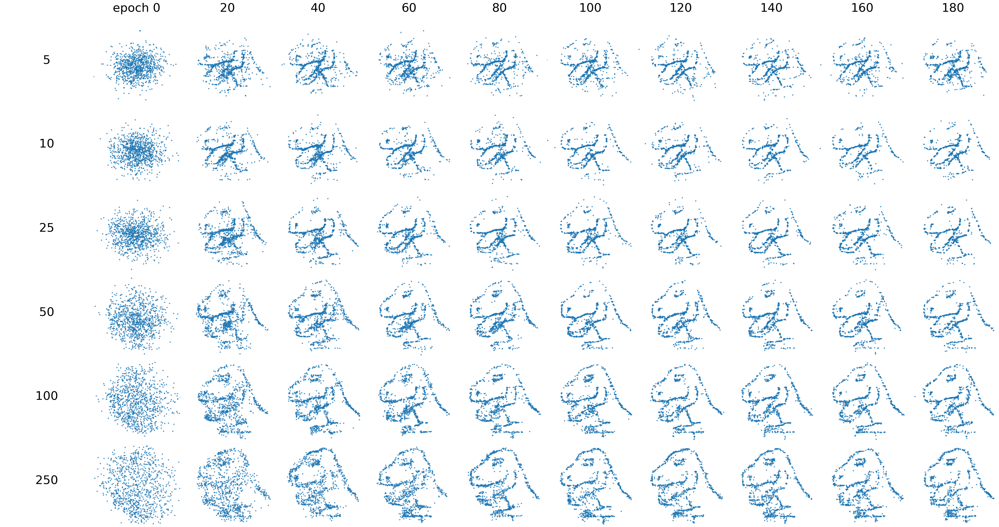

In [14]:
frames_dict = {
    "        5": np.load("exps/dino_timesteps5/frames.npy"),
    "       10": np.load("exps/dino_timesteps10/frames.npy"),
    "       25": np.load("exps/dino_timesteps25/frames.npy"),
    "       50": np.load("exps/dino_timesteps50/frames.npy"),
    "      100": np.load("exps/dino_timesteps100/frames.npy"),
    "      250": np.load("exps/dino_timesteps250/frames.npy"),
}

plot_ablation(frames_dict, "static/num_timesteps.png")

### beta schedule

In [15]:
!python ddpm.py --beta_schedule quadratic --experiment_name dino_quadratic_schedule

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|██████████████████████████████████████████| 50/50 [00:00<00:00, 732.30it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...


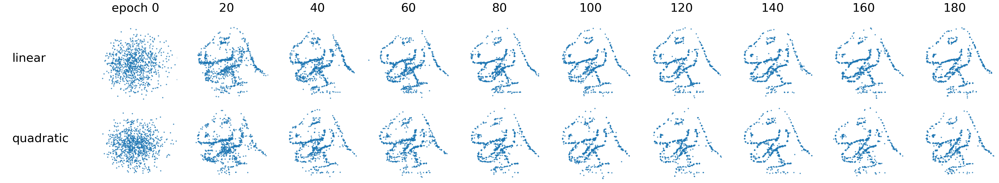

In [16]:
frames_dict = {
    "linear": np.load("exps/dino_base/frames.npy"),
    "quadratic": np.load("exps/dino_quadratic_schedule/frames.npy"),
}

plot_ablation(frames_dict, "static/beta_schedule.png")

### hidden size

In [17]:
!python ddpm.py --hidden_size 16 --experiment_name dino_hid_size_16
!python ddpm.py --hidden_size 32 --experiment_name dino_hid_size_32
!python ddpm.py --hidden_size 64 --experiment_name dino_hid_size_64
!python ddpm.py --hidden_size 256 --experiment_name dino_hid_size_256
!python ddpm.py --hidden_size 512 --experiment_name dino_hid_size_512

/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|█████████████████████████████████████████| 50/50 [00:00<00:00, 1221.03it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.26.4)
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion} is required for this version of "
Training model...
100%|█████████████████████████████████████████| 50/50 [00:00<00:00, 1122.68it/s]
Saving model...
Saving images...
Saving loss as numpy array...
Saving frames...
/usr/lib64/python3.9/site-packages/scipy/__init__.py:138: UserWarning: A NumPy versi

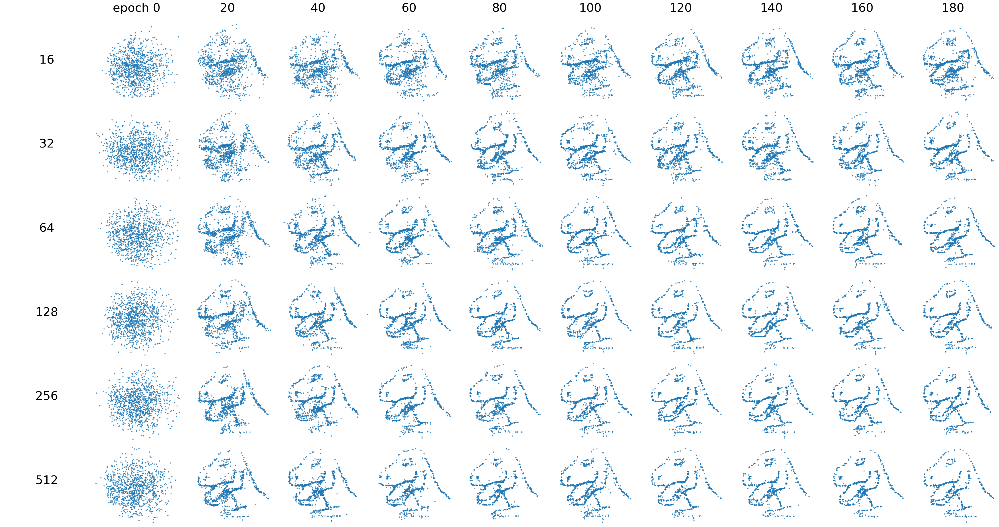

In [9]:
frames_dict = {
    "       16": np.load("exps/dino_hid_size_16/frames.npy"),
    "       32": np.load("exps/dino_hid_size_32/frames.npy"),
    "       64": np.load("exps/dino_hid_size_64/frames.npy"),
    "      128": np.load("exps/dino_base/frames.npy"),
    "      256": np.load("exps/dino_hid_size_256/frames.npy"),
    "      512": np.load("exps/dino_hid_size_512/frames.npy"),
}

plot_ablation(frames_dict, "static/hidden_size.png")

### num layers

In [ ]:
!python ddpm.py --hidden_layers 1 --experiment_name dino_hid_layers_1
!python ddpm.py --hidden_layers 2 --experiment_name dino_hid_layers_2
!python ddpm.py --hidden_layers 4 --experiment_name dino_hid_layers_4
!python ddpm.py --hidden_layers 5 --experiment_name dino_hid_layers_5

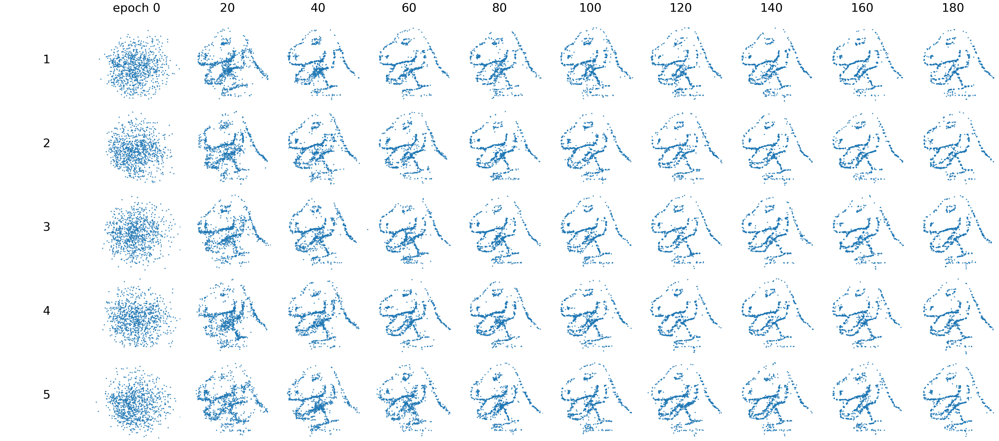

In [10]:
frames_dict = {
    "        1": np.load("exps/dino_hid_layers_1/frames.npy"),
    "        2": np.load("exps/dino_hid_layers_2/frames.npy"),
    "        3": np.load("exps/dino_base/frames.npy"),
    "        4": np.load("exps/dino_hid_layers_4/frames.npy"),
    "        5": np.load("exps/dino_hid_layers_5/frames.npy"),
    
}

plot_ablation(frames_dict, "static/num_hidden_layers.png")

### positional embedding (timestep)

In [ ]:
!python ddpm.py --time_embedding learnable --experiment_name dino_time_emb_learnable
!python ddpm.py --time_embedding linear --experiment_name dino_time_emb_linear
!python ddpm.py --time_embedding zero --experiment_name dino_time_emb_zeros

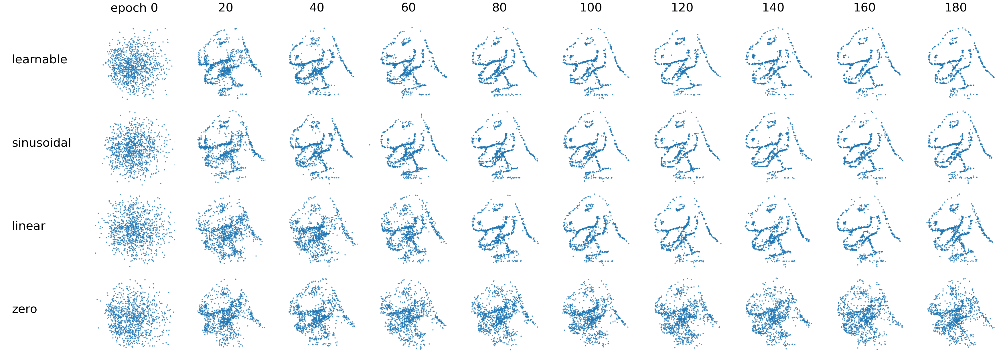

In [11]:
frames_dict = {
    "learnable": np.load("exps/dino_time_emb_learnable/frames.npy"),
    "sinusoidal": np.load("exps/dino_base/frames.npy"),
    "linear": np.load("exps/dino_time_emb_linear/frames.npy"),
    "zero": np.load("exps/dino_time_emb_zeros/frames.npy"),
}

plot_ablation(frames_dict, "static/time_embedding.png")

### positional embedding (inputs)

In [ ]:
!python ddpm.py --input_embedding learnable --experiment_name dino_input_emb_learnable
!python ddpm.py --input_embedding linear --experiment_name dino_input_emb_linear
!python ddpm.py --input_embedding identity --experiment_name dino_input_emb_identity

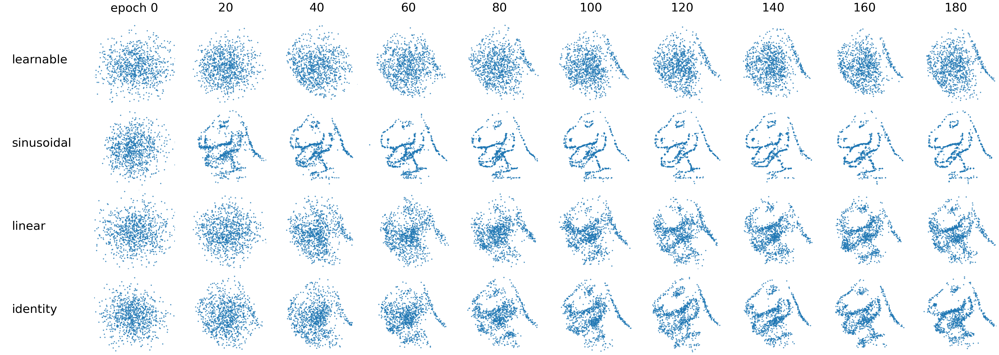

In [12]:
frames_dict = {
    "learnable": np.load("exps/dino_input_emb_learnable/frames.npy"),
    "sinusoidal": np.load("exps/dino_base/frames.npy"),
    "linear": np.load("exps/dino_input_emb_linear/frames.npy"),
    "identity": np.load("exps/dino_input_emb_identity/frames.npy"),
}

plot_ablation(frames_dict, "static/input_embedding.png")